PREPROCESSING THE DATA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv('churn_data.csv')

In [3]:
data.head()

,user,churn,age,housing,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,...,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,zodiac_sign,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
0,55409,0,37.0,na,NaN,0,0,0,0,0,...,0,0,0,0,Leo,1,0,NaN,0.00,0
1,23547,0,28.0,R,486.0,0,0,1,0,0,...,0,0,0,0,Leo,0,0,44.0,1.47,1
2,58313,0,35.0,R,561.0,47,2,86,47,0,...,0,0,0,0,Capricorn,1,0,65.0,2.17,0
3,8095,0,26.0,R,567.0,26,3,38,25,0,...,0,0,0,0,Capricorn,0,0,33.0,1.10,1
4,61353,1,27.0,na,NaN,0,0,2,0,0,...,0,0,0,0,Aries,1,0,1.0,0.03,0


In [4]:
data.columns

Index(['user', 'churn', 'age', 'housing', 'credit_score', 'deposits',
       'withdrawal', 'purchases_partners', 'purchases', 'cc_taken',
       'cc_recommended', 'cc_disliked', 'cc_liked', 'cc_application_begin',
       'app_downloaded', 'web_user', 'app_web_user', 'ios_user',
       'android_user', 'registered_phones', 'payment_type', 'waiting_4_loan',
       'cancelled_loan', 'received_loan', 'rejected_loan', 'zodiac_sign',
       'left_for_two_month_plus', 'left_for_one_month', 'rewards_earned',
       'reward_rate', 'is_referred'],
      dtype='object')

In [5]:
data.describe()

,user,churn,age,credit_score,deposits,withdrawal,purchases_partners,purchases,cc_taken,cc_recommended,...,registered_phones,waiting_4_loan,cancelled_loan,received_loan,rejected_loan,left_for_two_month_plus,left_for_one_month,rewards_earned,reward_rate,is_referred
count,27000.000000,27000.000000,26996.000000,18969.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,...,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,27000.000000,23773.000000,27000.000000,27000.000000
mean,35422.702519,0.413852,32.219921,542.944225,3.341556,0.307000,28.062519,3.273481,0.073778,92.625778,...,0.420926,0.001296,0.018815,0.018185,0.004889,0.173444,0.018074,29.110125,0.907684,0.318037
std,20321.006678,0.492532,9.964838,61.059315,9.131406,1.055416,42.219686,8.953077,0.437299,88.869343,...,0.912831,0.035981,0.135873,0.133623,0.069751,0.378638,0.133222,21.973478,0.752016,0.465723
min,1.000000,0.000000,17.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,17810.500000,0.000000,25.000000,507.000000,0.000000,0.000000,0.000000,0.000000,0.000000,10.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.200000,0.000000
50%,35749.000000,0.000000,30.000000,542.000000,0.000000,0.000000,9.000000,0.000000,0.000000,65.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,0.780000,0.000000
75%,53244.250000,1.000000,37.000000,578.000000,1.000000,0.000000,43.000000,1.000000,0.000000,164.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,48.000000,1.530000,1.000000
max,69658.000000,1.000000,91.000000,838.000000,65.000000,29.000000,1067.000000,63.000000,29.000000,522.000000,...,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,114.000000,4.000000,1.000000


In [6]:
data.isna().any() #checking null values

user                       False
churn                      False
age                         True
housing                    False
credit_score                True
deposits                   False
withdrawal                 False
purchases_partners         False
purchases                  False
cc_taken                   False
cc_recommended             False
cc_disliked                False
cc_liked                   False
cc_application_begin       False
app_downloaded             False
web_user                   False
app_web_user               False
ios_user                   False
android_user               False
registered_phones          False
payment_type               False
waiting_4_loan             False
cancelled_loan             False
received_loan              False
rejected_loan              False
zodiac_sign                False
left_for_two_month_plus    False
left_for_one_month         False
rewards_earned              True
reward_rate                False
is_referre

In [7]:
data.isna().sum()

user                          0
churn                         0
age                           4
housing                       0
credit_score               8031
deposits                      0
withdrawal                    0
purchases_partners            0
purchases                     0
cc_taken                      0
cc_recommended                0
cc_disliked                   0
cc_liked                      0
cc_application_begin          0
app_downloaded                0
web_user                      0
app_web_user                  0
ios_user                      0
android_user                  0
registered_phones             0
payment_type                  0
waiting_4_loan                0
cancelled_loan                0
received_loan                 0
rejected_loan                 0
zodiac_sign                   0
left_for_two_month_plus       0
left_for_one_month            0
rewards_earned             3227
reward_rate                   0
is_referred                   0
dtype: i

In [9]:
#removing columns with so huge number of null values and rows with null values
data = data[pd.notnull(data['age'])]
data = data.drop(columns = ['credit_score','rewards_earned'])

In [10]:
import pandas_profiling as pp
profile = pp.ProfileReport(data)
profile.to_file("profiling.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile

In [ ]:
#it's highly recommended to reduce the number of dependent msi_variables
# some of them are higly correlated so we can apply PCA or from sklearn.feature_selection use chi2, SelectKBest 

MANUAL CHARTS

In [13]:
dataset = data.drop(columns=['user','churn']) #churn is target value
y = data[['churn']]

In [15]:
#handaling categorical columns
cat_columns = ['housing', 
       'app_downloaded', 'ios_user', 'web_user','app_web_user',
       'android_user', 'registered_phones', 'payment_type', 'waiting_4_loan',
       'cancelled_loan', 'received_loan', 'rejected_loan', 'zodiac_sign',
       'left_for_two_month_plus', 'left_for_one_month', 'is_referred']
dataset = data[cat_columns]

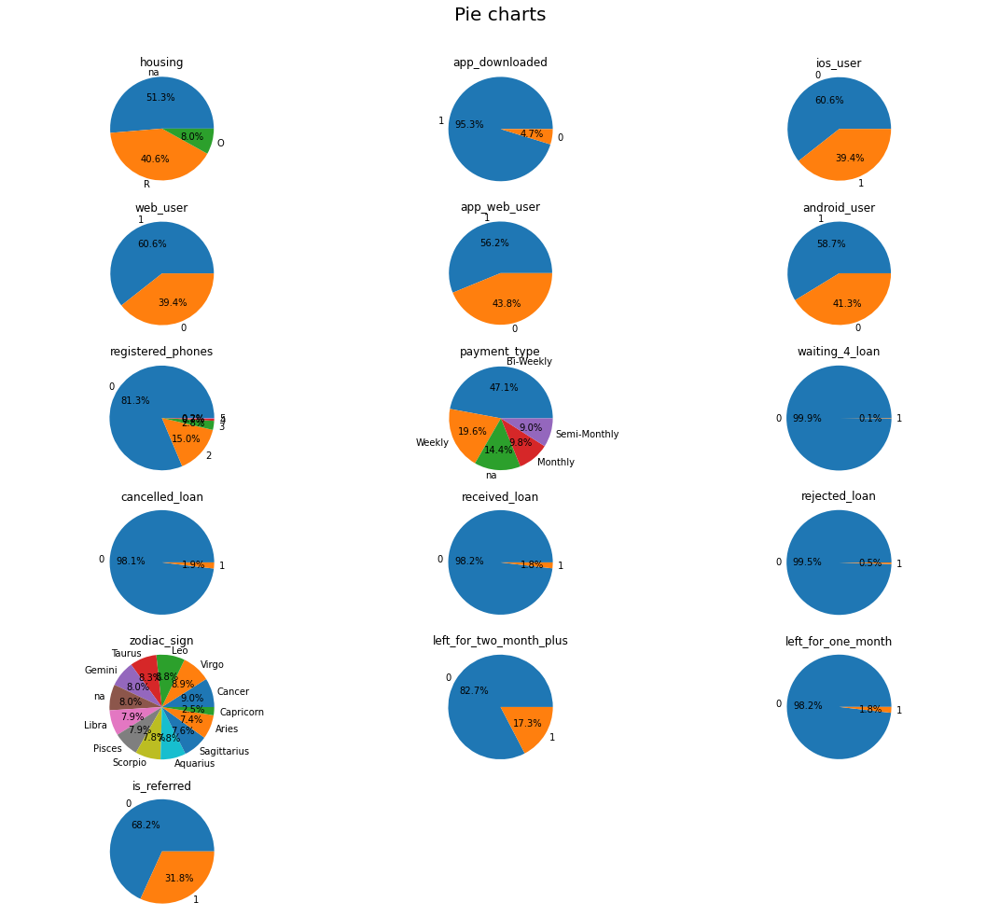

In [17]:
fig = plt.figure(figsize=(15,20))
plt.suptitle('Pie charts', fontsize = 20)
for i in range(1, dataset.shape[1]+1):
    plt.subplot(6,3,i)
    fig = plt.gca()
    fig.axes.get_yaxis().set_visible(False)
    fig.set_title(dataset.columns.values[i-1])
    values = dataset.iloc[:,i-1].value_counts(normalize=True).values
    index = dataset.iloc[:,i-1].value_counts(normalize=True).index
    plt.pie(values, labels = index, autopct='%1.1f%%')

    plt.axis('equal')
plt.tight_layout(rect=[0,0.3,1,0.95])



In [18]:
#columns related to loans are higly inbalanced and would harm the model performance so we want to examine them
data[dataset.waiting_4_loan == 1].churn.value_counts()

0    27
1     8
Name: churn, dtype: int64

In [19]:
data[dataset.cancelled_loan == 1].churn.value_counts()

1    274
0    234
Name: churn, dtype: int64

In [20]:
data[dataset.received_loan == 1].churn.value_counts()

1    292
0    199
Name: churn, dtype: int64

In [21]:
data[dataset.rejected_loan == 1].churn.value_counts()

1    107
0     25
Name: churn, dtype: int64

In [22]:
data[dataset.left_for_one_month == 1].churn.value_counts()

1    266
0    222
Name: churn, dtype: int64

In [23]:
data[dataset.left_for_two_month_plus == 1].churn.value_counts()

0    2719
1    1964
Name: churn, dtype: int64

In [ ]:
#above distributions are balanced so we don't assume it is strongly bias column. We can remove these columns

CORRELATION with response variable (churn)

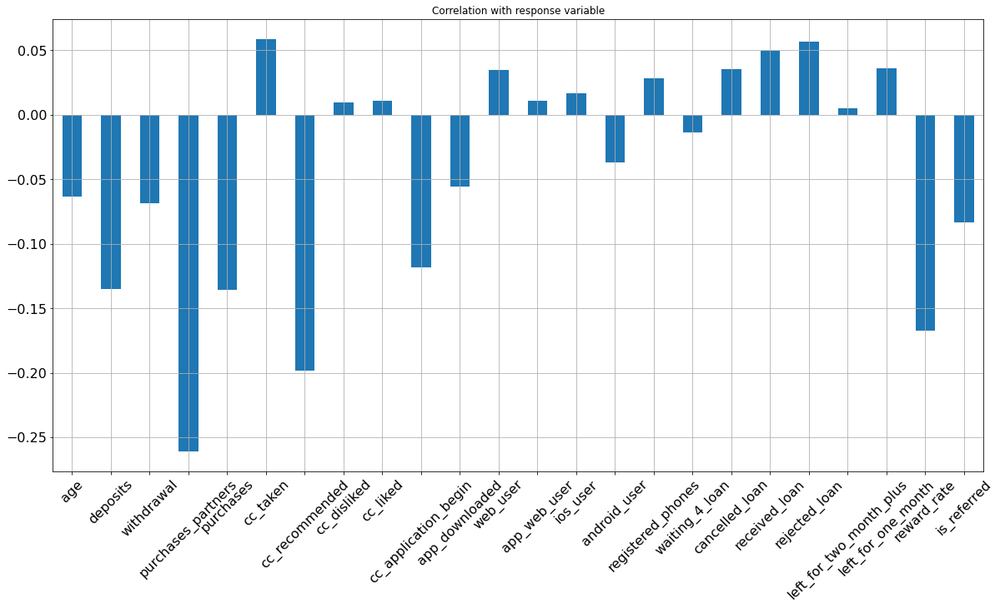

In [25]:
data.drop(columns = ['churn','user', 'housing', 'payment_type','zodiac_sign']).corrwith(data.churn).plot.bar(
    figsize=(20,10),title = 'Correlation with response variable', fontsize = 16, rot = 45, grid = True
)

In [26]:
#correlation between 'ios_user' and 'android_user' - supposed to be highly correlated
data['ios_user'].corr(data['android_user'])

-0.8400843218424128

In [28]:
#'app_web_user' is positive if and only 'web_user' is positive and 'app_download' is positive
data['app_web_user'].corr(data['web_user']*data['app_downloaded'])
#it means the are not independent - we can remove 'app_web_user'

0.9999999999999999

In [29]:
data.drop(columns = 'app_web_user', inplace = True)

In [31]:
data.to_csv('dataset.csv',index = False)

DATA PREPARATION FOR MODEL

In [33]:
user_id = data['user']
y = data['churn']
data.drop(columns=['user','churn'], inplace=True)

In [34]:
dataset = pd.get_dummies(data)
dataset.columns

Index(['age', 'deposits', 'withdrawal', 'purchases_partners', 'purchases',
       'cc_taken', 'cc_recommended', 'cc_disliked', 'cc_liked',
       'cc_application_begin', 'app_downloaded', 'web_user', 'ios_user',
       'android_user', 'registered_phones', 'waiting_4_loan', 'cancelled_loan',
       'received_loan', 'rejected_loan', 'left_for_two_month_plus',
       'left_for_one_month', 'reward_rate', 'is_referred', 'housing_O',
       'housing_R', 'housing_na', 'payment_type_Bi-Weekly',
       'payment_type_Monthly', 'payment_type_Semi-Monthly',
       'payment_type_Weekly', 'payment_type_na', 'zodiac_sign_Aquarius',
       'zodiac_sign_Aries', 'zodiac_sign_Cancer', 'zodiac_sign_Capricorn',
       'zodiac_sign_Gemini', 'zodiac_sign_Leo', 'zodiac_sign_Libra',
       'zodiac_sign_Pisces', 'zodiac_sign_Sagittarius', 'zodiac_sign_Scorpio',
       'zodiac_sign_Taurus', 'zodiac_sign_Virgo', 'zodiac_sign_na'],
      dtype='object')

In [36]:
#removing correlated columns within OHE
dataset.drop(columns = ['housing_na',  'zodiac_sign_na', 'payment_type_na'], inplace = True)

MODEL with all dependent variables

In [37]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(dataset, y, test_size = 0.2, stratify = y, random_state = 42)

In [38]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

Comparing the classifier models

In [39]:
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

In [40]:
names = [
    "Nearest Neighbors",
    "Linear SVM",
    "RBF SVM",
    'Gaussian Classifier',
    "Decision Tree",
    "Random Forest",
    "Neural Net",
    "AdaBoost",
    "Naive Bayes",
    "QDA"
]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()
]

In [43]:
scores = dict()
for name, clf in zip(names, classifiers):
        clf.fit(X_train_sc, y_train)
        score = clf.score(X_test_sc, y_test)
        scores[name] = score

In [44]:
scores

{'Nearest Neighbors': 0.5957407407407408,
 'Linear SVM': 0.6420370370370371,
 'RBF SVM': 0.5975925925925926,
 'Gaussian Classifier': 0.6079629629629629,
 'Decision Tree': 0.6924074074074074,
 'Random Forest': 0.6090740740740741,
 'Neural Net': 0.6938888888888889,
 'AdaBoost': 0.6868518518518518,
 'Naive Bayes': 0.6068518518518519,
 'QDA': 0.6303703703703704}

GridSearch for Decision Tree

In [45]:
from sklearn.model_selection import GridSearchCV

params = {'n_estimators':[20,50,100,300,500], 'max_depth':[3,5,10,None],
'min_samples_split':[2,4,8],'min_samples_leaf':[1,2,4,6]}
rfc = RandomForestClassifier()

grid = GridSearchCV(estimator=rfc,
             param_grid=params, verbose=1)
grid.fit(X_train_sc, y_train)
grid.best_score_ 

Fitting 5 folds for each of 240 candidates, totalling 1200 fits


0.7175867291811375

In [46]:
model_rfc = grid
model_rfc.best_params_

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 500}

In [50]:
y_pred = model_rfc.predict(X_test_sc)
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.74      0.84      0.79      3165
           1       0.73      0.59      0.65      2235

    accuracy                           0.74      5400
   macro avg       0.74      0.72      0.72      5400
weighted avg       0.74      0.74      0.73      5400



In [51]:
print(classification_report(y_train, model_rfc.predict(X_train_sc)))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     12657
           1       0.99      0.99      0.99      8939

    accuracy                           0.99     21596
   macro avg       0.99      0.99      0.99     21596
weighted avg       0.99      0.99      0.99     21596



In [ ]:
#so the conclusion is that model is overfitted. We can try reduce number of variables

L1-based future selection

In [53]:
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC
lsvc = LinearSVC(C=0.01, penalty="l1", dual=False).fit(dataset, y)
model = SelectFromModel(lsvc, prefit=True)
X_new = model.transform(dataset)
X_new.shape
#reduced no of variables from 41 to 25

(26996, 25)

In [63]:
from sklearn.pipeline import Pipeline
X_new_train, X_new_test, y_train, y_test = train_test_split(X_new, y, test_size = 0.2, stratify = y, random_state = 0)
pipe = Pipeline(steps = [
        ('scale', StandardScaler()),
        ('RandomForest', RandomForestClassifier(n_estimators=500, min_samples_split=4))])

pipe.fit(X_new_train,y_train)
pipe.score(X_new_test,y_test)

0.7240740740740741

L2-based selection

In [73]:
np.array(dataset.columns).shape

(41,)

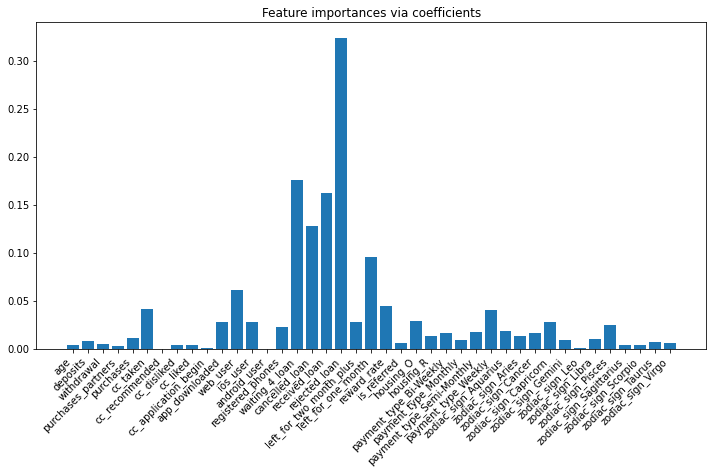

In [81]:
from sklearn.linear_model import RidgeCV
ridge = RidgeCV(alphas=np.logspace(-6, 6, num=5)).fit(dataset, y)
importance = np.abs(ridge.coef_)
feature_names = np.array(dataset.columns)
plt.figure(figsize=(12,6))
plt.bar(height=importance, x=feature_names)
plt.xticks(rotation=45,ha='right')
plt.title("Feature importances via coefficients")
plt.show()

In [83]:
from sklearn.feature_selection import SequentialFeatureSelector

sfs_forward = SequentialFeatureSelector(
    ridge, n_features_to_select=2, direction="forward"
).fit(dataset, y)

"""sfs_backward = SequentialFeatureSelector(
    ridge, n_features_to_select=2, direction="backward"
).fit(dataset, y)"""


print(
    "Features selected by forward sequential selection: "
    f"{feature_names[sfs_forward.get_support()]}"
)


ImportError: cannot import name 'SequentialFeatureSelector' from 'sklearn.feature_selection' (/anaconda/envs/azureml_py38/lib/python3.8/site-packages/sklearn/feature_selection/__init__.py)

In [84]:
#the above is not working anymore in newest sklearn. let's try another preprocessing
from sklearn.feature_selection import SelectKBest, chi2
X_new = SelectKBest(chi2, k=20).fit_transform(dataset, y)
X_new.shape
(1797, 20)

(1797, 20)

In [85]:
from sklearn.pipeline import Pipeline
X_new_train, X_new_test, y_train, y_test = train_test_split(X_new, y, test_size = 0.2, stratify = y, random_state = 0)
pipe = Pipeline(steps = [
        ('scale', StandardScaler()),
        ('RandomForest', RandomForestClassifier(n_estimators=500, min_samples_split=4))])

pipe.fit(X_new_train,y_train)
pipe.score(X_new_test,y_test)

0.7131481481481482

In [86]:
y_pred = pipe.predict(X_new_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.73      0.82      0.77      3165
           1       0.68      0.57      0.62      2235

    accuracy                           0.71      5400
   macro avg       0.71      0.69      0.70      5400
weighted avg       0.71      0.71      0.71      5400



In [87]:
y_pred = pipe.predict(X_new_train)
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97     12657
           1       0.96      0.97      0.96      8939

    accuracy                           0.97     21596
   macro avg       0.97      0.97      0.97     21596
weighted avg       0.97      0.97      0.97     21596



In [96]:
#still overfitted but less.

PCA

In [89]:
X = dataset
X.columns

Index(['age', 'deposits', 'withdrawal', 'purchases_partners', 'purchases',
       'cc_taken', 'cc_recommended', 'cc_disliked', 'cc_liked',
       'cc_application_begin', 'app_downloaded', 'web_user', 'ios_user',
       'android_user', 'registered_phones', 'waiting_4_loan', 'cancelled_loan',
       'received_loan', 'rejected_loan', 'left_for_two_month_plus',
       'left_for_one_month', 'reward_rate', 'is_referred', 'housing_O',
       'housing_R', 'payment_type_Bi-Weekly', 'payment_type_Monthly',
       'payment_type_Semi-Monthly', 'payment_type_Weekly',
       'zodiac_sign_Aquarius', 'zodiac_sign_Aries', 'zodiac_sign_Cancer',
       'zodiac_sign_Capricorn', 'zodiac_sign_Gemini', 'zodiac_sign_Leo',
       'zodiac_sign_Libra', 'zodiac_sign_Pisces', 'zodiac_sign_Sagittarius',
       'zodiac_sign_Scorpio', 'zodiac_sign_Taurus', 'zodiac_sign_Virgo'],
      dtype='object')

In [91]:
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings("ignore")

In [92]:
scaler = StandardScaler()
X_sc = scaler.fit_transform(X)

In [94]:
pca = PCA()
pca.fit_transform(X_sc)
pca_variance = pca.explained_variance_

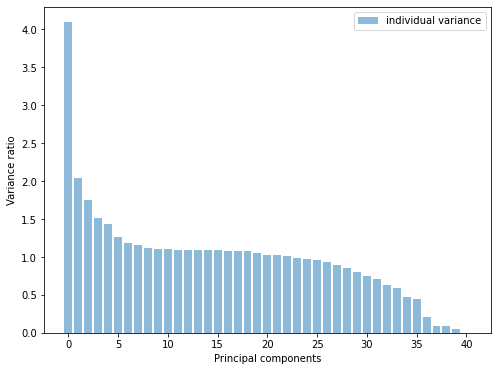

In [95]:
plt.figure(figsize=(8, 6))
plt.bar(range(dataset.shape[1]), pca_variance, alpha=0.5, align='center', label='individual variance')
plt.legend()
plt.ylabel('Variance ratio')
plt.xlabel('Principal components')
plt.show()

In [97]:
expl_var_df = pd.DataFrame()
expl_var_df['explained_var']=pca.explained_variance_ratio_
expl_var_df['cum_explained_var']=expl_var_df['explained_var'].cumsum()
expl_var_df['principal_com'] = np.arange(1,len(expl_var_df)+1)
expl_var_df.head(10)

,explained_var,cum_explained_var,principal_com
0,0.099896,0.099896,1
1,0.049676,0.149572,2
2,0.042799,0.192371,3
3,0.036825,0.229196,4
4,0.034969,0.264165,5
5,0.030718,0.294883,6
6,0.029017,0.323900,7
7,0.028128,0.352028,8
8,0.027232,0.379260,9
9,0.026946,0.406206,10


In [98]:
expl_var_df.set_index('principal_com',inplace=True)

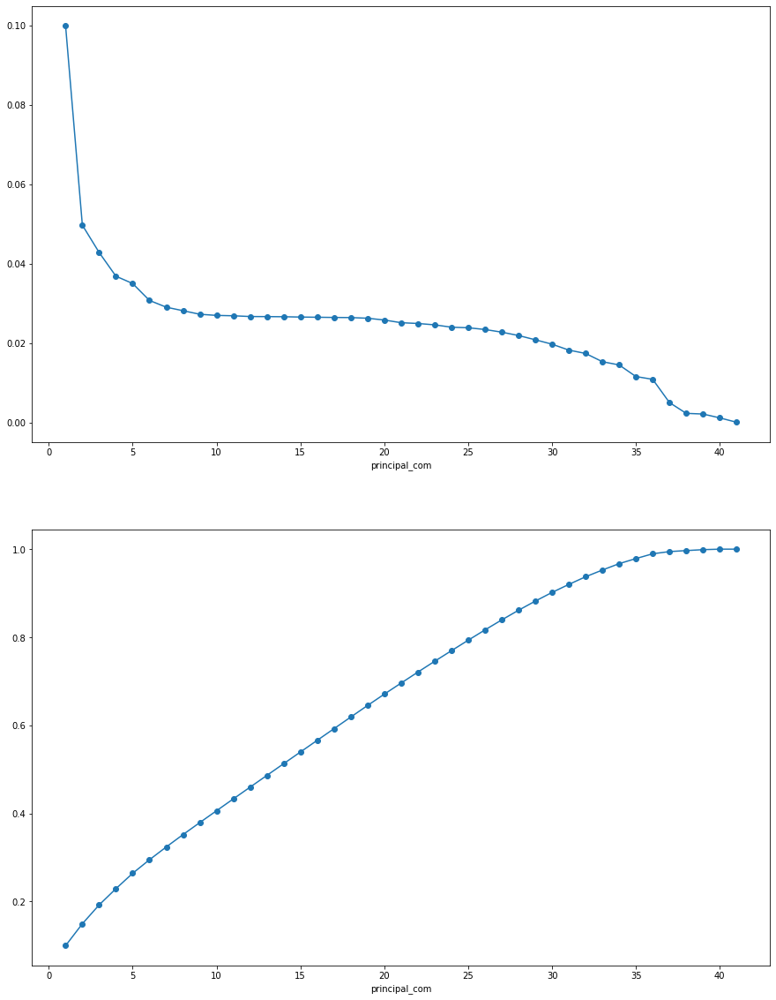

In [99]:
fig,ax = plt.subplots(nrows = 2, figsize=(15,20))
expl_var_df['explained_var'].head(50).plot(kind='line',marker = 'o', ax=ax[0])
expl_var_df['cum_explained_var'].head(50).plot(kind='line',marker = 'o', ax=ax[1])